In [1]:
import os

import yaml
from PIL import Image
import torch

from modules import *
from visprog import ProgramRunner

/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [3]:
bgblur = BGBlur()
colorpop = ColorPop()
count = Count()
crop = Crop()
crop_left = CropLeft()
crop_right = CropRight()
crop_above = CropAbove()
crop_below = CropBelow()
emoji = Emoji()
eval_ = Eval()
facedet = FaceDet(device='cpu')
loc = Loc(device='cpu', threshold=0.08)
replace = Replace(device='cuda:0' if torch.cuda.is_available() else 'cpu')
result_ = Result()
seg = Seg(device='cpu')
select = Select(seg.model.config.id2label, seg.model.config.label2id, device='cuda:0' if torch.cuda.is_available() else 'cpu')
vqa = VQA(device='cpu')

text_encoder/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


In [4]:
modules = [bgblur, colorpop, count, crop, crop_left, crop_right, crop_above, crop_below, emoji, eval_, facedet, loc, replace, result_, seg, select, vqa]

In [5]:
program_runner = ProgramRunner(modules)

In [6]:
def do_imgedit(image: Image, program: str):
  initial_state = {
    'IMAGE': image,
  }
  steps, result = program_runner.execute_program(program, initial_state)
  return steps, result

In [20]:
with open('assets/fig7/prompts_all.yaml', 'r') as f:
  prompts = yaml.safe_load(f)

In [8]:
images_dir = 'assets/fig7'

Replace Leonardo DiCaprio with Leonardo DiCaprio wearing sunglasses


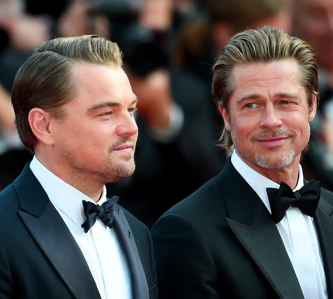

In [17]:
prompt = prompts[0]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 4, image.size[1] // 4))

Program:
OBJ0=SEG(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Leonardo DiCaprio',category=None)
IMAGE0=REPLACE(image=IMAGE,object=OBJ1,prompt='Leonardo DiCaprio wearing sunglasses')
FINAL_RESULT=RESULT(var=IMAGE0)



/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 0: Program:. Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


  0%|          | 0/50 [00:00<?, ?it/s]

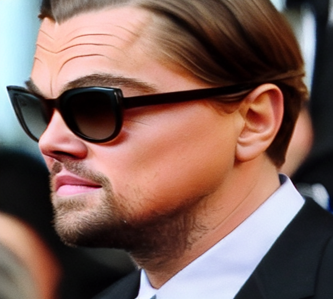

In [9]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

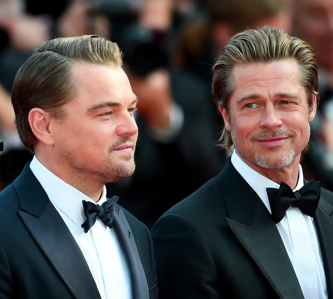

In [11]:
result.step_details[0]['output'][1].resize((image.size[0] // 4, image.size[1] // 4))

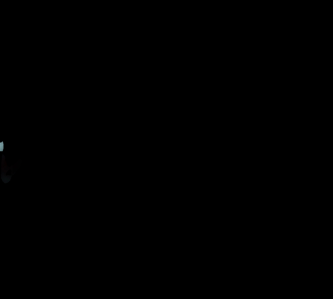

In [12]:
result.step_details[2]['masked_image'].resize((image.size[0] // 4, image.size[1] // 4))

Program:
OBJ0=SEG(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Leonardo DiCaprio',category='person')
IMAGE0=REPLACE(image=IMAGE,object=OBJ1,prompt='Leonardo DiCaprio wearing sunglasses')
FINAL_RESULT=RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

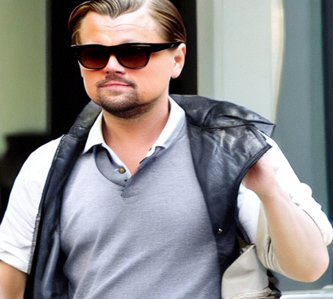

In [10]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

Program:
OBJ0=SEG(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Leonardo DiCaprio',category=None)
IMAGE0=REPLACE(image=IMAGE,object=OBJ1,prompt='Leonardo DiCaprio wearing sunglasses')
FINAL_RESULT=RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

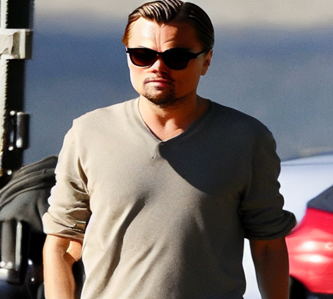

In [13]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

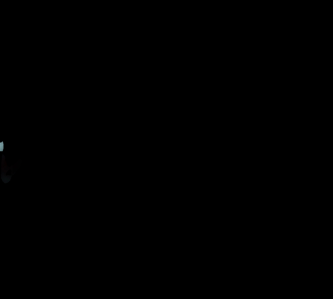

In [14]:
result.step_details[2]['masked_image'].resize((image.size[0] // 4, image.size[1] // 4))

OBJ0=FACEDET(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Leonardo DiCaprio',category=None)
IMAGE0=REPLACE(image=IMAGE,object=OBJ1,prompt='Leonardo DiCaprio wearing sunglasses')
FINAL_RESULT=RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

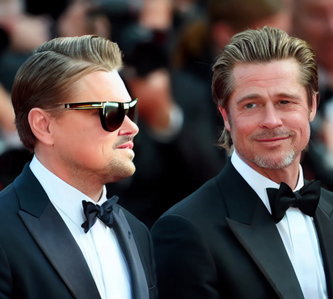

In [18]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

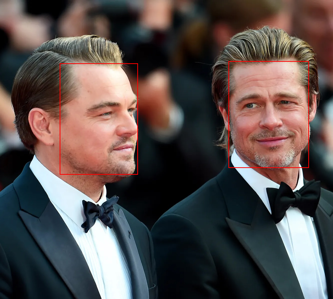

In [19]:
result.step_details[0]['image_with_bbox'].resize((image.size[0] // 4, image.size[1] // 4))

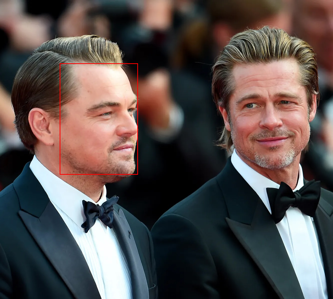

In [20]:
result.step_details[1]['output'].resize((image.size[0] // 4, image.size[1] // 4))

OBJ0 = FACEDET(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Leonardo DiCaprio', category=None)
IMAGE0 = EMOJI(image=IMAGE, object=OBJ1, emoji='smiling_face_with_sunglasses')
FINAL_RESULT = RESULT(var=IMAGE0)



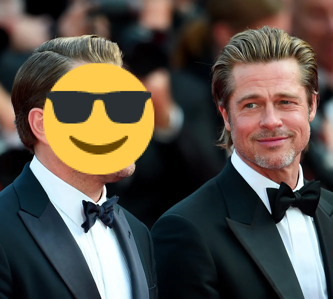

In [21]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

Create a colorpop of the woman in blue and the woman in red and blur the background


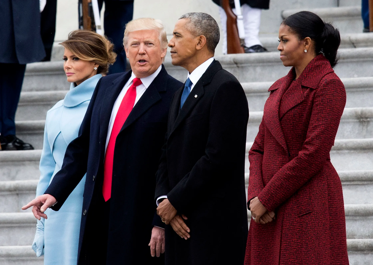

In [21]:
prompt = prompts[1]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 6, image.size[1] // 6))

In [9]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='woman in blue', category=None)
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='woman in red', category=None)
IMAGE0 = COLORPOP(image=IMAGE, object=OBJ1)
IMAGE1 = COLORPOP(image=IMAGE0, object=OBJ2)
IMAGE2 = BGBLUR(image=IMAGE1, object=None)
FINAL_RESULT = RESULT(var=IMAGE2)


KeyError: 'None'

OBJ0=SEG(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='woman in blue,woman in red',category=None)
IMAGE0=COLORPOP(image=IMAGE,object=OBJ1)
IMAGE1=BGBLUR(image=IMAGE0,object=OBJ1)
FINAL_RESULT=RESULT(var=IMAGE1)


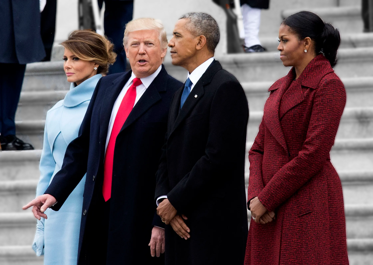

In [22]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

'OBJ0=SEG(image=IMAGE)'

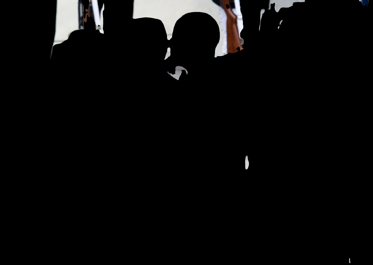

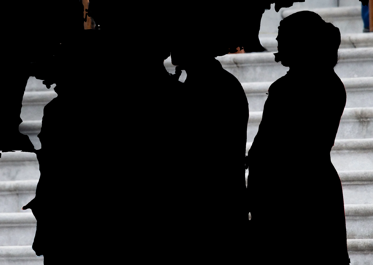

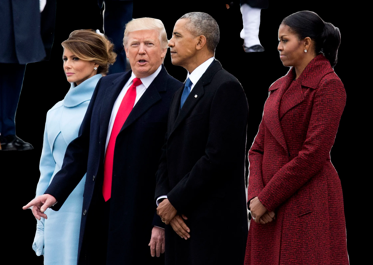

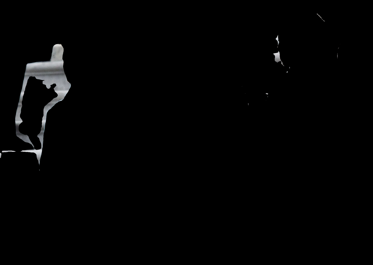

In [26]:
display(steps[0], *[i.resize((image.size[0] // 6, image.size[1] // 6)) for i in result.step_details[0]['output']])

OBJ1=SELECT(image=IMAGE,object=OBJ0,query='woman in blue,woman in red',category=None)


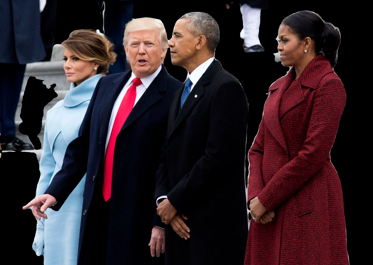

In [27]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 6, image.size[1] // 6))

IMAGE0=COLORPOP(image=IMAGE,object=OBJ1)


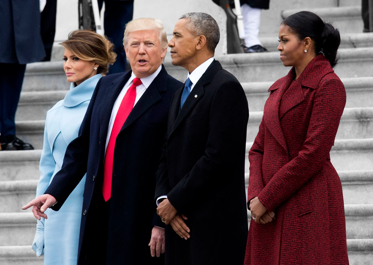

In [28]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 6, image.size[1] // 6))

IMAGE1=BGBLUR(image=IMAGE0,object=OBJ1)


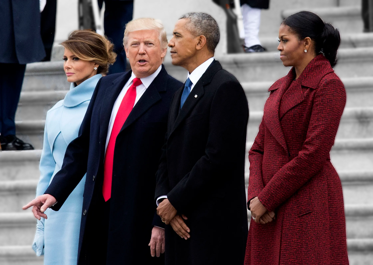

In [29]:
print(steps[3])
result.step_details[3]['output'].resize((image.size[0] // 6, image.size[1] // 6))

In [30]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='woman in blue', category=None)
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='woman in red', category=None)
IMAGE0 = COLORPOP(image=IMAGE, object=OBJ1)
IMAGE1 = COLORPOP(image=IMAGE, object=OBJ2)
IMAGE2 = BGBLUR(image=IMAGE, object=[OBJ1, OBJ2])
FINAL_RESULT = RESULT(var=IMAGE2)


/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 5: IMAGE2 = BGBLUR(image=IMAGE, object=[OBJ1, OBJ2]). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


KeyError: 'IMAGE2'

In [31]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='woman in blue', category=None)
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='woman in red', category=None)
IMAGE0 = COLORPOP(image=IMAGE, object=[OBJ1, OBJ2])
IMAGE1 = BGBLUR(image=IMAGE0, object=[OBJ1, OBJ2])
FINAL_RESULT = RESULT(var=IMAGE1)


/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 3: IMAGE0 = COLORPOP(image=IMAGE, object=[OBJ1, OBJ2]). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."
/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 4: IMAGE1 = BGBLUR(image=IMAGE0, object=[OBJ1, OBJ2]). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


KeyError: 'IMAGE1'

In [32]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='woman in blue', category=None)
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='woman in red', category=None)
IMAGE0 = COLORPOP(image=IMAGE, object=[OBJ1, OBJ2])
IMAGE1 = BGBLUR(image=IMAGE0, object=[OBJ1, OBJ2])
FINAL_RESULT = RESULT(var=IMAGE1)


KeyError: 'IMAGE1'

Replace Anne Hathaway with Emma Watson and Meryl Streep with Jennifer Lawrence


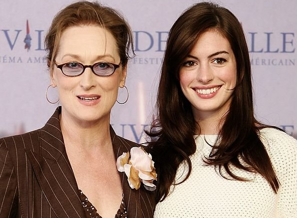

In [33]:
prompt = prompts[2]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')
OBJ2 = SELECT(image=IMAGE0, object=OBJ0, query='Meryl Streep', category=None)
IMAGE1 = REPLACE(image=IMAGE0, object=OBJ2, prompt='Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE1)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

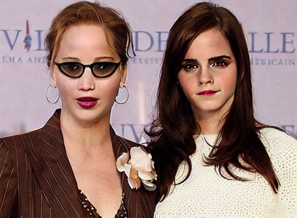

In [35]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)


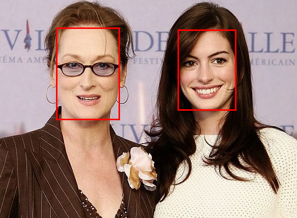

In [36]:
print(steps[0])
result.step_details[0]['image_with_bbox'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category=None)


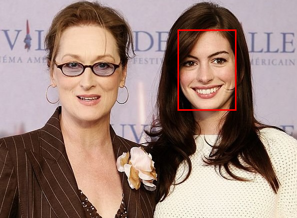

In [37]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')


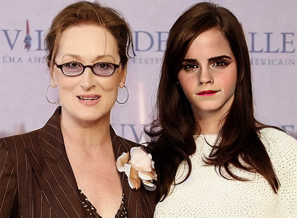

In [38]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ2 = SELECT(image=IMAGE0, object=OBJ0, query='Meryl Streep', category=None)


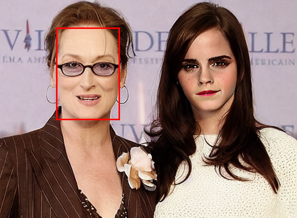

In [39]:
print(steps[3])
result.step_details[3]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE1 = REPLACE(image=IMAGE0, object=OBJ2, prompt='Jennifer Lawrence')


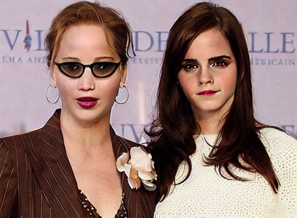

In [40]:
print(steps[4])
result.step_details[4]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway,Meryl Streep', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')
OBJ2 = SELECT(image=IMAGE0, object=OBJ0, query='Meryl Streep', category=None)
IMAGE1 = REPLACE(image=IMAGE0, object=OBJ2, prompt='Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE1)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

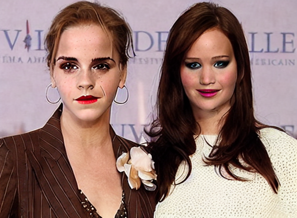

In [47]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)


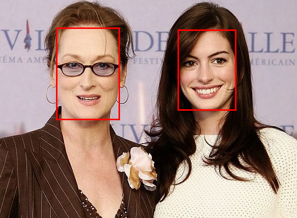

In [48]:
print(steps[0])
result.step_details[0]['image_with_bbox'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway,Meryl Streep', category=None)


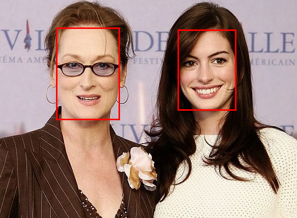

In [49]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')


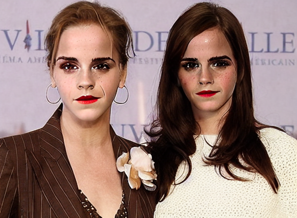

In [50]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ2 = SELECT(image=IMAGE0, object=OBJ0, query='Meryl Streep', category=None)


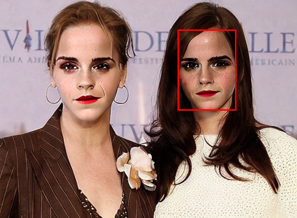

In [51]:
print(steps[3])
result.step_details[3]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE1 = REPLACE(image=IMAGE0, object=OBJ2, prompt='Jennifer Lawrence')


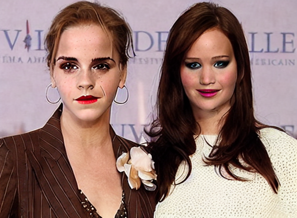

In [52]:
print(steps[4])
result.step_details[4]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0=FACEDET(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Anne Hathaway,Meryl Streep',category=None)
IMAGE0=REPLACE(image=IMAGE,object=OBJ1,prompt='Emma Watson')
OBJ2=SEG(image=IMAGE0)
OBJ3=SELECT(image=IMAGE0,object=OBJ2,query='Meryl Streep',category=None)
IMAGE1=REPLACE(image=IMAGE0,object=OBJ3,prompt='Jennifer Lawrence')
FINAL_RESULT=RESULT(var=IMAGE1)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

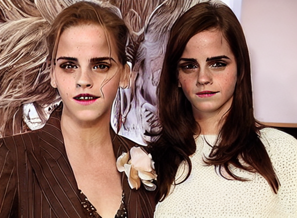

In [53]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0=FACEDET(image=IMAGE)


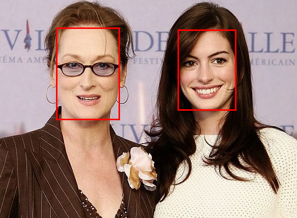

In [54]:
print(steps[0])
result.step_details[0]['image_with_bbox'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ1=SELECT(image=IMAGE,object=OBJ0,query='Anne Hathaway,Meryl Streep',category=None)


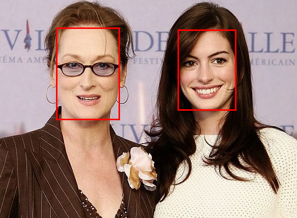

In [55]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0=REPLACE(image=IMAGE,object=OBJ1,prompt='Emma Watson')


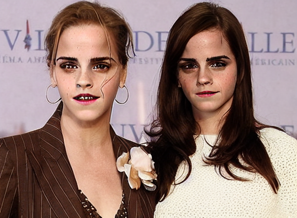

In [56]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

'OBJ2=SEG(image=IMAGE0)'

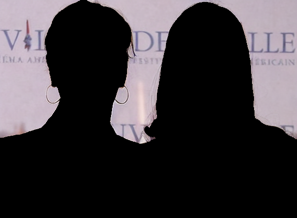

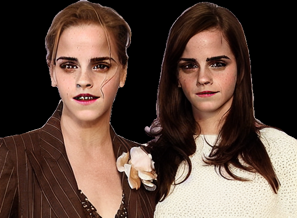

In [58]:
display(steps[3], *[i.resize((image.size[0] // 2, image.size[1] // 2)) for i in result.step_details[3]['output']])

OBJ3=SELECT(image=IMAGE0,object=OBJ2,query='Meryl Streep',category=None)


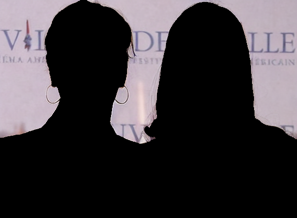

In [59]:
print(steps[4])
result.step_details[4]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE1=REPLACE(image=IMAGE0,object=OBJ3,prompt='Jennifer Lawrence')


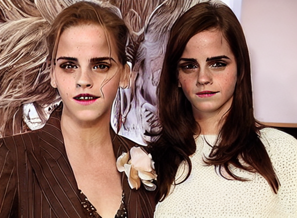

In [62]:
print(steps[5])
result.step_details[5]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway,Meryl Streep', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')
OBJ2 = SEG(image=IMAGE0)
OBJ3 = SELECT(image=IMAGE0, object=OBJ2, query='Meryl Streep', category=None)
IMAGE1 = REPLACE(image=IMAGE0, object=OBJ3, prompt='Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE1)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

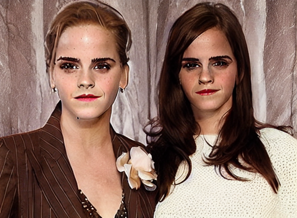

In [63]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)


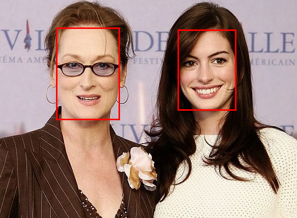

In [64]:
print(steps[0])
result.step_details[0]['image_with_bbox'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway,Meryl Streep', category=None)


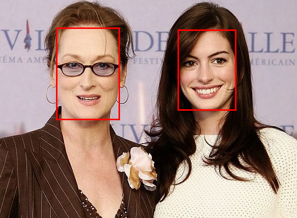

In [65]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')


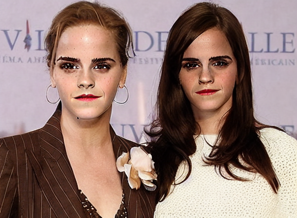

In [66]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

'OBJ2 = SEG(image=IMAGE0)'

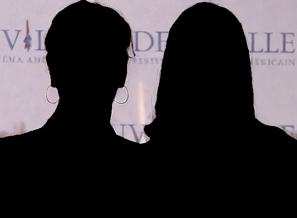

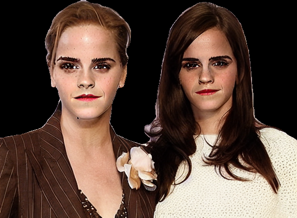

In [68]:
display(steps[3], *[i.resize((image.size[0] // 2, image.size[1] // 2)) for i in result.step_details[3]['output']])

OBJ3 = SELECT(image=IMAGE0, object=OBJ2, query='Meryl Streep', category=None)


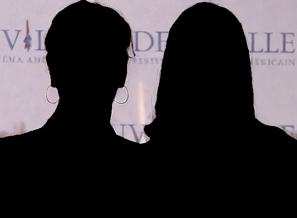

In [69]:
print(steps[4])
result.step_details[4]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE1 = REPLACE(image=IMAGE0, object=OBJ3, prompt='Jennifer Lawrence')


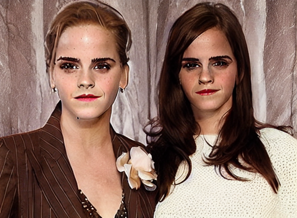

In [70]:
print(steps[5])
result.step_details[5]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category=None)
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='Meryl Streep', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')
IMAGE1 = REPLACE(image=IMAGE0, object=OBJ2, prompt='Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE1)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

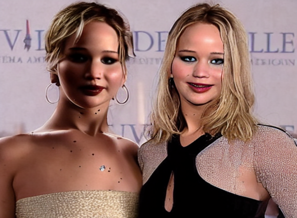

In [71]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

'OBJ0 = SEG(image=IMAGE)'

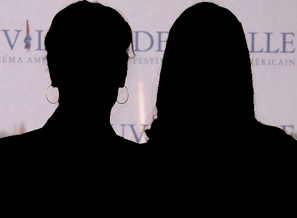

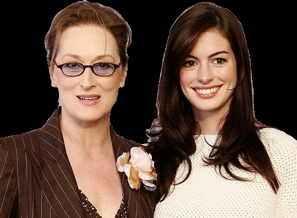

In [72]:
display(steps[0], *[i.resize((image.size[0] // 2, image.size[1] // 2)) for i in result.step_details[0]['output']])

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category=None)


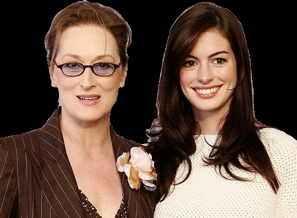

In [73]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='Meryl Streep', category=None)


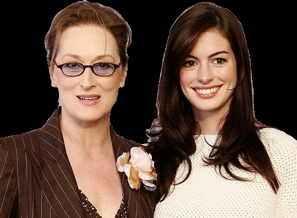

In [74]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')


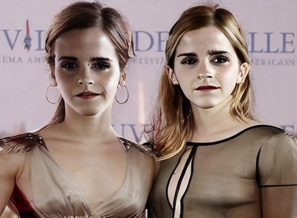

In [75]:
print(steps[3])
result.step_details[3]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE1 = REPLACE(image=IMAGE0, object=OBJ2, prompt='Jennifer Lawrence')


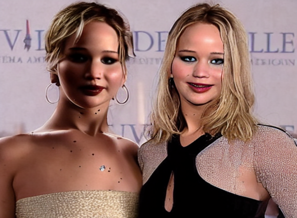

In [76]:
print(steps[4])
result.step_details[4]['output'].resize((image.size[0] // 2, image.size[1] // 2))

Replace the desert by sandy beach


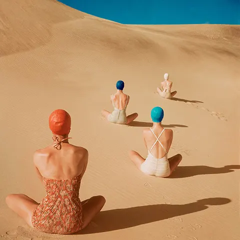

In [77]:
prompt = prompts[3]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

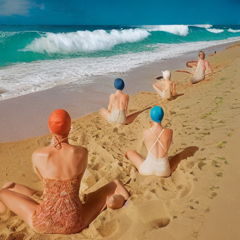

In [78]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

'OBJ0 = SEG(image=IMAGE)'

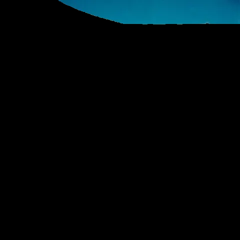

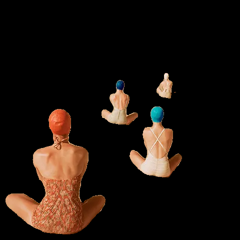

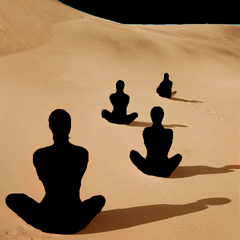

In [79]:
display(steps[0], *[i.resize((image.size[0] // 2, image.size[1] // 2)) for i in result.step_details[0]['output']])

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)


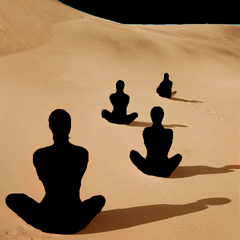

In [80]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')


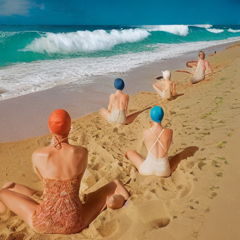

In [81]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

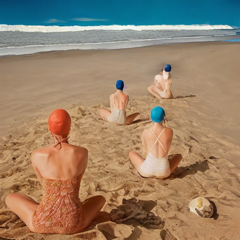

In [82]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

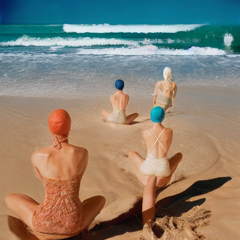

In [83]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

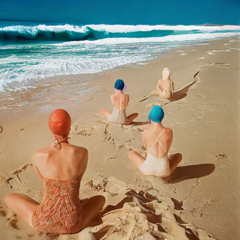

In [84]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

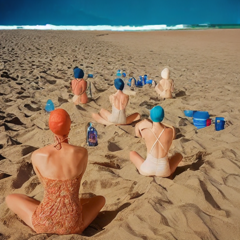

In [85]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

Replace the couch with a plush blue couch


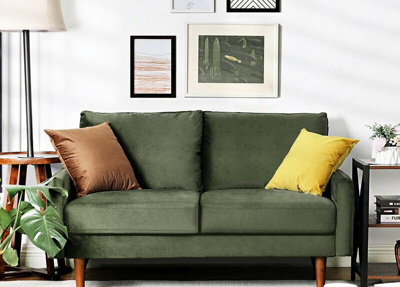

In [86]:
prompt = prompts[4]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

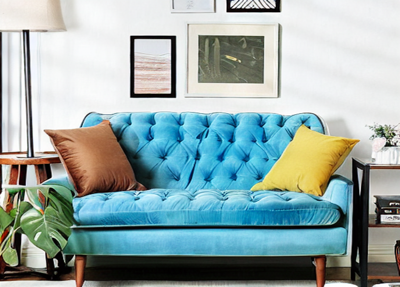

In [87]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

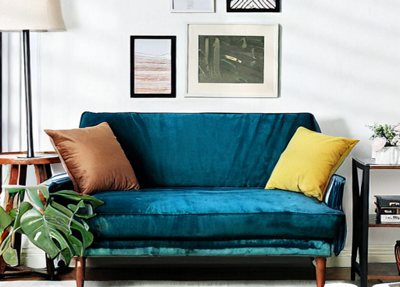

In [88]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

'OBJ0 = SEG(image=IMAGE)'

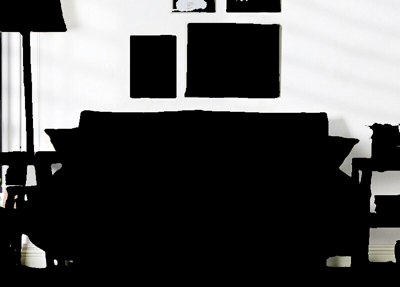

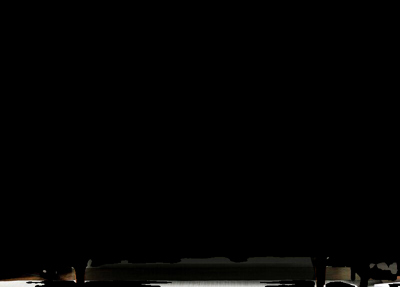

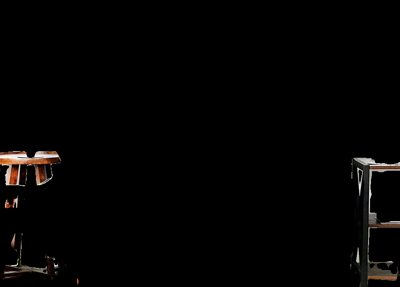

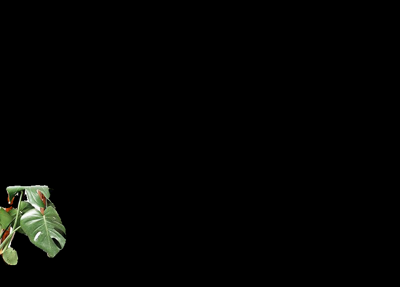

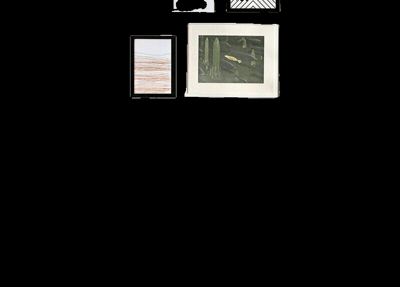

...

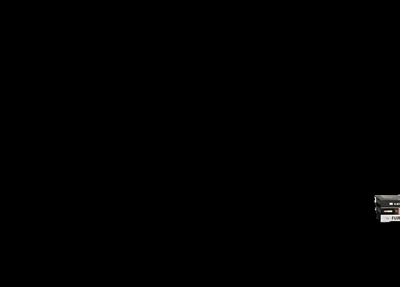

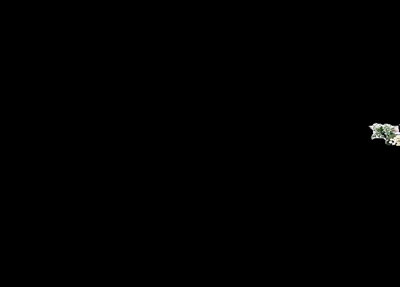

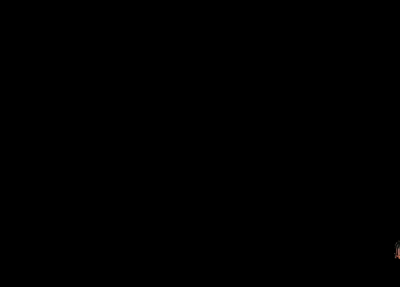

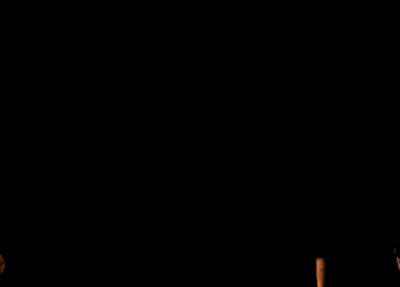

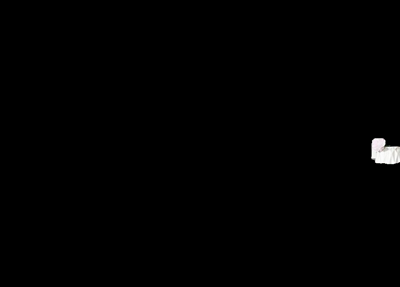

In [89]:
display(steps[0], *[i.resize((image.size[0] // 2, image.size[1] // 2)) for i in result.step_details[0]['output']])

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)


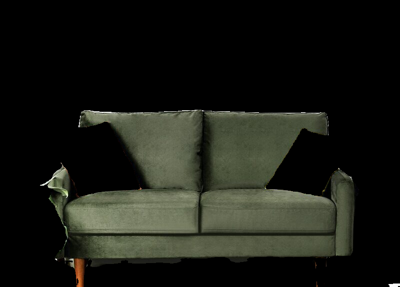

In [90]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')


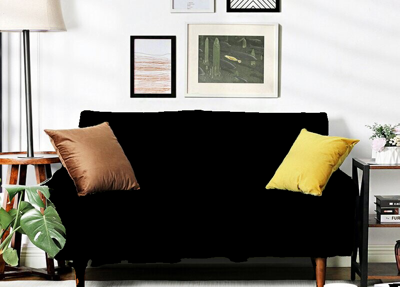

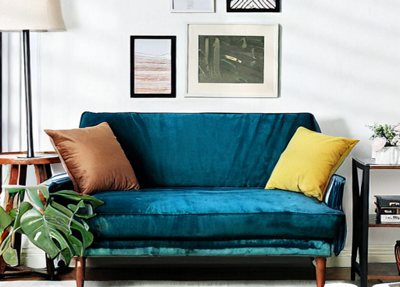

In [91]:
print(steps[2])
display(result.step_details[2]['masked_image'].resize((image.size[0] // 2, image.size[1] // 2)),
        result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2)))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

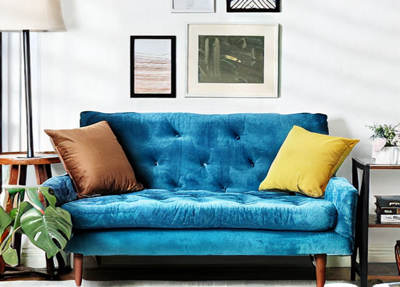

In [92]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0=SEG(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='couch',category=None)
IMAGE0=REPLACE(image=IMAGE,object=OBJ1,prompt='plush blue couch')
FINAL_RESULT=RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

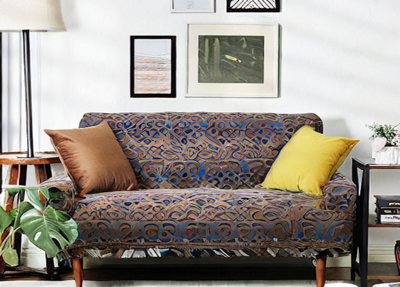

In [93]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')
FINAL_RESULT = RESULT(var=IMAGE0)


  0%|          | 0/50 [00:00<?, ?it/s]

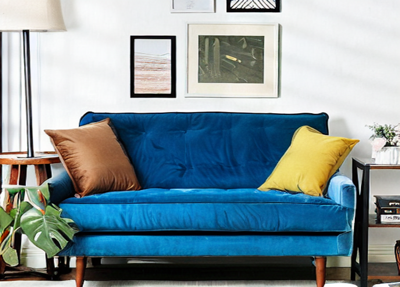

In [94]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))